# Import relevant packages

In [1]:
from landslide_sentry.tiff_downloader import getROIFromTargetPoint, downloadEssentialTifFiles
from landslide_sentry.tiff_utils import preprocessTiffs

import os
import shutil

Making HTTPS connection to accounts.google.com

>
Successfully saved authorization token.


# Download raw tiff files from Google Earth Engine

In [2]:
roi = getROIFromTargetPoint(141.9, 42.8, 20, 20)

data_path = "./raw_data/"
if os.path.exists(data_path):
    shutil.rmtree(data_path)

pre_path = os.path.join(data_path, "pre")
post_path = os.path.join(data_path, "post")
dem_path = os.path.join(data_path, "dem")

downloadEssentialTifFiles(roi, pre_path, post_path, dem_path, '2017-07-20', '2018-07-20', '2018-07-20', '2019-07-20', 30)

preprocessTiffs(pre_path, post_path, data_path)


Encountered exception: <class 'ee.ee_exception.EEException'> - Image.select: Pattern 'B2' did not match any bands.
This could be due to level 2 data not available for the selected dates.
Try downloading alternative level 1 data (cloud mask not avaliable)


100%|██████████| 13.1M/13.1M [00:03<00:00, 3.74MiB/s]
100%|██████████| 15.1M/15.1M [00:05<00:00, 2.96MiB/s]
100%|██████████| 22.7k/22.7k [00:00<00:00, 312kiB/s]
100%|██████████| 398k/398k [00:00<00:00, 622kiB/s]
100%|██████████| 1.15M/1.15M [00:00<00:00, 1.35MiB/s]
100%|██████████| 322k/322k [00:01<00:00, 166kiB/s]


# Generate landslide map using neural network

2021-10-03 02:18:18.265089: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-10-03 02:18:18.265152: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


TF Version --> 2.6.0
GDAL Version --> 3.0.2
OPEN CV Version --> 4.5.3
CURRENT WORKING DIR --> /home/chenyu_zhang/Documents/nasa-space-app/nasa-space-app-sentry/example
./landslide_mapping --> Folder exists!!!
5 files found in ./landslide_mapping --> Will be deleted.


2021-10-03 02:18:19.809106: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: UNKNOWN ERROR (100)
2021-10-03 02:18:19.809185: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (DESKTOP-K04HMMI): /proc/driver/nvidia/version does not exist
2021-10-03 02:18:31.743442: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
100%|██████████| 256/256 [01:05<00:00,  3.88it/s]


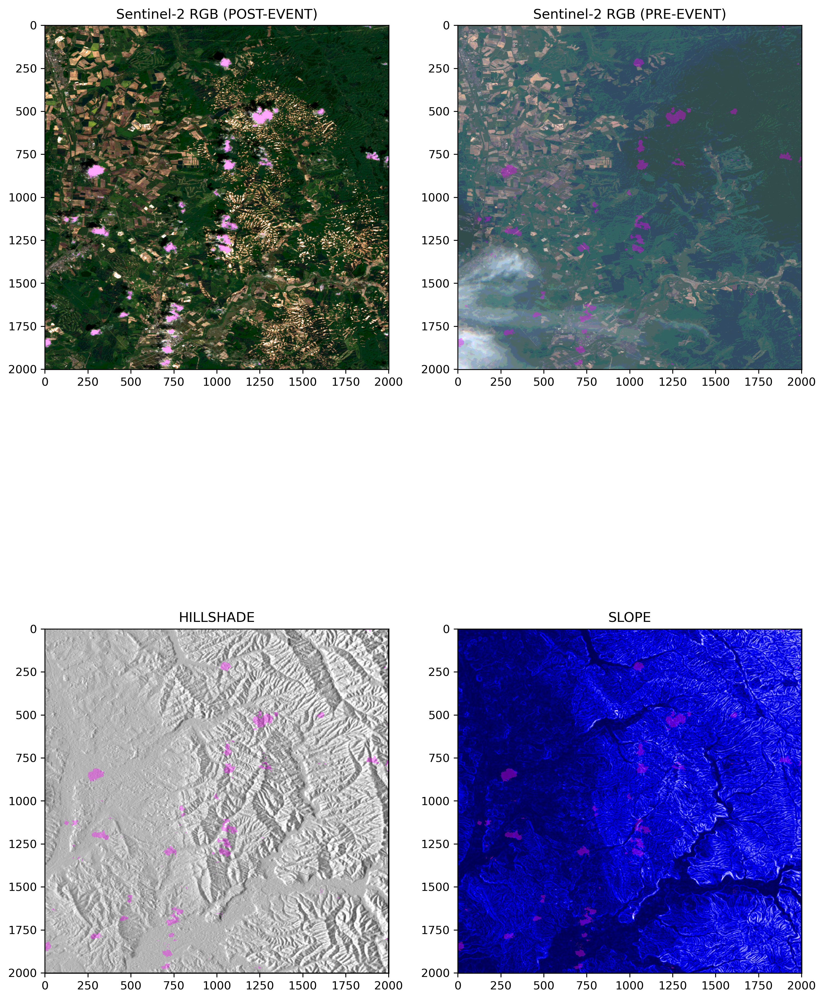

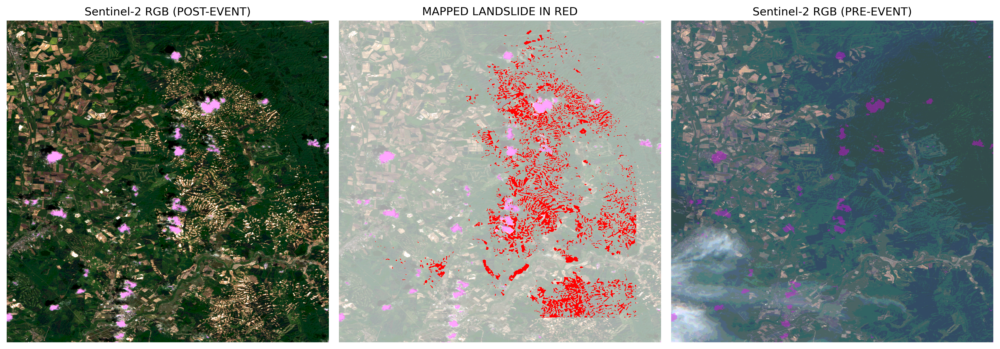

In [3]:
from landslide_sentry.landslide_mapping import generateLandsideMap

result_path = "./landslide_mapping"

generateLandsideMap("../model/M_ALL_006.hdf5", pre_path, post_path,
                    dem_path, result_path, data_path, debug=True)
